# Getting Started with Advanced Spaceborne Thermal Emission and Reflection Radiometer (ASTER) Version 4

## Summary  

This tutorial was developed to provide a basic outline on how to programically access [Advanced Spaceborne Thermal Emission and Reflection Radiometer](https://terra.nasa.gov/about/terra-instruments/aster) (ASTER) Verion 4. ASTER version 4 is a result of the [Final ASTER Data Processing Campaign](https://www.earthdata.nasa.gov/news/feature-articles/nasa-begins-final-aster-data-processing-campaign) undertaken at NASA's [Land Processes Distributed Active Archieve Center](https://www.earthdata.nasa.gov/centers/lp-daac) (LP DAAC). ASTER Version 4 includes 11 products all of which are archived in the NASA EarthData Cloud. In this notebook we will show how to search, discover and plot ASTER Version 4 data for the [Raiload Valley](https://www.usgs.gov/media/images/railroad-valley-playa), Nevada, USA using the `earthaccess` and `rioxarray` libraries. Specifically, this tutorial will show how to find the [ASTER Level-1 Precision Terrain Corrected Registered At-Sensnor Radiance V004](https://doi.org/10.5067/ASTER/AST_L1T.004) (AST_L1T)  data available in the EarthData Cloud for our specific time period, bands (layers), and region of interest. After finding the desired data, we will load subsets of the cloud optimized geotiffs (COGs) into a Jupyter Notebook directly from the cloud, virualize a Short-wave infared (SWIR) composite image.

## Background  

Launched December 18, 1999 abroad NASA's [Terra](https://terra.nasa.gov/) satellite [Advanced Spaceborne Thermal Emission and Reflection Radiometer](https://terra.nasa.gov/about/terra-instruments/aster) (ASTER) has acquired more then 3 Million unique images of the Earth's Surface. ASTER acquires 15 to 90 square meter images of the Earth in 14 different wavelenths ranging from visiable to infared light. Historically, most ASTER data products were produced using the Simple, Scalable, Script Based Science Processor for Missions (S4PM) on demand architecture. With the [Final ASTER Data Processing Campaign](https://www.earthdata.nasa.gov/news/feature-articles/nasa-begins-final-aster-data-processing-campaign) 11 Version 4 ASTER Data products are now achieved in Cloud Optmized GeoTIFF (COG) format stored in the EarthData cloud environment which enables users greater access to the ASTER archieve. ASTER data is useful for a variey of areas including creating maps of land surface temperature, emissivity reflectance and elevation. Specific applications for ASTER data include, surface mineral resource exploration, tracking volcanoes, and tracking land cover change. The table below denotes the 11 products available in ASTER Version 4.

|Product    |           Product Page               | Collection Shortname  |
| :----:  |          :----:              | :---       |
| ASTER L1A Reconstructed Unprocessed Instrument Data       |https://doi.org/10.5067/ASTER/AST_L1A.004            | AST_L1A     |
| ASTER L1B Registered Radiance at the Sensor      |          https://doi.org/10.5067/ASTER/AST_L1B.004            | AST_L1B  |
| ASTER Level 1T Precision Terrain Corrected Registered At-Sensor Radiance       |          https://doi.org/10.5067/ASTER/AST_L1T.004           | AST_L1T   |
| ASTER L2 Surface Radiance TIR       | https://doi.org/10.5067/ASTER/AST_09T.004    | AST_09T  |
| ASTER L2 Surface Kinetic Temperature      |          https://doi.org/10.5067/ASTER/AST_08.004          | AST_08   |
| ASTER L2 Surface Emissivity       |          https://doi.org/10.5067/ASTER/AST_05.004          | AST_05|
| ASTER L2 Surface Radiance VNIR and SWIR       |          https://doi.org/10.5067/ASTER/AST_09.004          | AST_09     |
| ASTER L2 Surface Radiance VNIR and Crosstalk Corrected SWIR V004       |          https://doi.org/10.5067/aster/ast_09xt.004          | AST_09XT     |
| ASTER L2 Surface Reflectance VNIR and SWIR        |          https://doi.org/10.5067/ASTER/AST_07.004          | AST_07     |
| ASTER L2 Surface Reflectance VNIR and Crosstalk Corrected SWIR       |          https://doi.org/10.5067/ASTER/AST_07XT.004          | AST_07XT     |
| ASTER Digital Elevation Model       |          https://doi.org/10.5067/ASTER/AST14DEM.004          | AST14DEM     |


NASA's Land Processes Distributed Active Archive Center (LP DAAC) archives and distributes ASTER Version 4 products in the EarthData cloud archive as Cloud Optimized GeoTIFFs (COG). This tutorial will demonstrate because these data are stored as COGs, this tutorial will teach users how to load subsets of individual files into memory for just the layers you are interested in. This tutorial covers how to search for, process and "stack" the ASTER data over a region of interest into an [xarray](http://xarray.pydata.org/en/stable/) data array filter and visualize [ASTER Level-1 Precision Terrain Corrected Registered At-Sensnor Radiance V004](https://doi.org/10.5067/ASTER/AST_L1T.004) (AST_L1T) data.

## Requirements  

- A [NASA Earthdata Login](https://urs.earthdata.nasa.gov/) account is required to download the data used in this tutorial. You can create an account at the link provided.

- A compatible Python environment with the VSWIR Imaging and Thermal Applications, Learning, and Science ([VITALS](https://github.com/nasa/VITALS/tree/main)) environment installed. Please refer to the [Setup](https://github.com/nasa/VITALS/blob/main/setup/setup_instructions.md) Instructions for setting up the VITALS Environment.

## Learning Objectives

- How to work with ASTER L1T ([AST_L1T](https://doi.org/10.5067/ASTER/AST_L1T.004)) data products  
- How to query and ASTER L1T data using the earthaccess library  
- How to access and work with ASTER_L1T data

## Data Used  

ASTER Level 1T Precision Terrain Corrected Registered At-Sensor Radiance V004 - [AST_L1T](https://doi.org/10.5067/ASTER/AST_L1T.004)
 - Variables (layers):  
        - [SWIR_Band4](https://cmr.earthdata.nasa.gov/search/concepts/V3489841927-LPCLOUD.html)<br>
        - [SWIR_Band6](https://cmr.earthdata.nasa.gov/search/concepts/V3489841990-LPCLOUD.html)<br>
        - [SWIR_Band8](https://cmr.earthdata.nasa.gov/search/concepts/V3489842004-LPCLOUD.html)<br>
 
 Important: [ASTER Shortwage Infared](https://lpdaac.usgs.gov/documents/1661/ASTER_SWIR_User_Advisory_Jan_12_2009.pdf) (SWIR) bands are no longer provided with data acquired after April 2008.


## Tutorial Outline  

1. [**Getting Started**](#getstarted)  
    1.1 Import Packages<br>
    1.2 Setup Current Working Directory  
    1.3 EarthData Login  
2. [**Finding ASTER Version 4 Data**](#find)<br>
    2.1 Find ASTER Version 4 Collections<b4>
    2.2 Set spatial and temporal search parameters<br>
    2.3 Visualize where the spatial location is we are working with<br>
    2.4 Perform Data Query for AST_L1T data within our geographic and temporal periods of interest and review the results   
3. [**Accessing AST_L1T COG Data in the Cloud**](#cloudaccess)  
    3.1 Group by Band
4. [**Processing AST_L1T Data**](#process)   
    4.1 Load AST_L1T data into memory and subset spatially  
    4.2 Make all subset variables into one xarray dataset 
    4.3 Export to COG  
5. [**Visualizations of AST_L1T Data**](#Visualizations)
    5.1 Visualize three SWIR bands using `matplotlib`<br>
    5.2 Create and Visualize Three band RGB Composite<br>

## 1. Getting Started<a id="getstarted"></a>

### 1.1 Import Packages 

Import the required packages.

In [1]:
import os
from datetime import datetime
from collections import defaultdict
import numpy as np
import pandas as pd
import geopandas as gp
from osgeo import gdal
import xarray as xr
import rioxarray as rxr
import hvplot.xarray
import earthaccess
import holoviews as hv
import folium
from folium import Marker
from shapely.geometry import Polygon
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### 1.2 Setup Current Working Directory

We will use a directory called data is the default working directory for the tutorial. Any required ancillary files will be read from here also any outputs downloaded will be written here.

In [2]:
os.chdir('../../data')

### 1.3 Earthdata Login Authentication

We will use the [earthaccess](https://github.com/nsidc/earthaccess#readme) package for authentication. `earthaccess` can either create a new local .netrc file to store credentials or validate that one exists already in you user profile. If you do not have a .netrc file, you will be prompted for your credentials and one will be created. 

In [3]:
earthaccess.login(persist=True)

## 2. Finding ASTER Version 4 Data using `earthaccess` <a id="find"></a>

To find ASTER Version 4 data, we will use the `earthaccess` python library to search NASA's Common Metadata Repository (CMR) for ASTER Version 4 data. We will use a geojson file containing our region of interest (ROI) to search for files that intersect. To do this, we will simplify it to a bounding box. Grab the bounding coordinates from the geopandas object after opening.

### 2.1 Lets explorer the ASTER Version 4 Collections
With `earthacesss` we can locate all of the available ASTER Version 4 Collections using the keyword argument "ASTER 004". We will use the collection shortname for the ASTER Level-1 Precision Terrain Corrected Registered At-Sensnor Radiance V004 collection to locate specific granules later. 

In [4]:
datasets = earthaccess.search_datasets(
    keyword="ASTER 004",
    cloud_hosted=True)

In [5]:
pd.json_normalize(datasets)

,meta.revision-id,meta.deleted,meta.format,meta.provider-id,meta.has-combine,meta.user-id,meta.has-formats,meta.associations.variables,meta.s3-links,meta.has-spatial-subsetting,meta.native-id,meta.has-transforms,meta.association-details.variables,meta.has-variables,meta.concept-id,meta.revision-date,meta.granule-count,meta.has-temporal-subsetting,meta.concept-type,umm.CollectionCitations,umm.AdditionalAttributes,umm.SpatialExtent.HorizontalSpatialDomain.Geometry.BoundingRectangles,umm.SpatialExtent.HorizontalSpatialDomain.Geometry.CoordinateSystem,umm.SpatialExtent.HorizontalSpatialDomain.ResolutionAndCoordinateSystem.HorizontalDataResolution.GenericResolutions,umm.SpatialExtent.SpatialCoverageType,umm.SpatialExtent.GranuleSpatialRepresentation,umm.CollectionProgress,umm.StandardProduct,umm.ScienceKeywords,umm.TemporalExtents,umm.ProcessingLevel.Id,umm.ProcessingLevel.ProcessingLevelDescription,umm.DOI.DOI,umm.DOI.Authority,umm.ShortName,umm.EntryTitle,umm.Quality,umm.DirectDistributionInformation.S3BucketAndObjectPrefixNames,umm.DirectDistributionInformation.Region,umm.DirectDistributionInformation.S3CredentialsAPIEndpoint,umm.DirectDistributionInformation.S3CredentialsAPIDocumentationURL,umm.RelatedUrls,umm.ContactGroups,umm.DataDates,umm.Abstract,umm.LocationKeywords,umm.MetadataDates,umm.MetadataAssociations,umm.Version,umm.Projects,umm.UseConstraints.LicenseURL.Name,umm.UseConstraints.LicenseURL.Linkage,umm.UseConstraints.LicenseURL.Description,umm.UseConstraints.LicenseURL.MimeType,umm.CollectionDataType,umm.DataCenters,umm.TemporalKeywords,umm.Platforms,umm.MetadataSpecification.URL,umm.MetadataSpecification.Name,umm.MetadataSpecification.Version,umm.ArchiveAndDistributionInformation.FileArchiveInformation,umm.ArchiveAndDistributionInformation.FileDistributionInformation,umm.AccessConstraints.Description,umm.UseConstraints.Description,umm.SpatialExtent.HorizontalSpatialDomain.ResolutionAndCoordinateSystem.GeodeticModel.HorizontalDatumName,umm.MetadataLanguage,umm.UseConstraints.FreeAndOpenData,umm.SpatialExtent.HorizontalSpatialDomain.ResolutionAndCoordinateSystem.HorizontalDataResolution.VariesResolution
0,35,False,application/vnd.nasa.cmr.umm+json,LPCLOUD,False,arketch,False,"[V3489842038-LPCLOUD, V3489842004-LPCLOUD, V34...","[s3://lp-prod-protected/AST_L1T.004, s3://lp-p...",False,AST_L1T/004,False,"[{'concept-id': 'V3489842038-LPCLOUD'}, {'conc...",True,C3306888411-LPCLOUD,2025-08-28T19:06:01.463Z,3701643,False,collection,"[{'Version': '004', 'Title': 'ASTER Level 1T P...","[{'Name': 'Projection', 'Description': 'The ma...","[{'WestBoundingCoordinate': -180, 'NorthBoundi...",CARTESIAN,"[{'XDimension': 15, 'YDimension': 15, 'Unit': ...",HORIZONTAL,GEODETIC,ACTIVE,True,"[{'Category': 'EARTH SCIENCE', 'Topic': 'SPECT...",[{'RangeDateTimes': [{'BeginningDateTime': '20...,1T,Sensor Measurements,10.5067/ASTER/AST_L1T.004,https://doi.org,AST_L1T,ASTER Level 1T Precision Terrain Corrected Reg...,Users are advised that ASTER SWIR data acquire...,"[s3://lp-prod-protected/AST_L1T.004, s3://lp-p...",us-west-2,https://data.lpdaac.earthdatacloud.nasa.gov/s3...,https://data.lpdaac.earthdatacloud.nasa.gov/s3...,[{'Description': 'Earthdata Search allows user...,"[{'Roles': ['User Services'], 'ContactInformat...","[{'Type': 'CREATE', 'Date': '2025-05-15T12:00:...",The Terra Advanced Spaceborne Thermal Emission...,"[{'Category': 'GEOGRAPHIC REGION', 'Type': 'GL...","[{'Type': 'CREATE', 'Date': '2025-05-15T00:00:...","[{'Type': 'INPUT', 'EntryId': 'AST_L1A', 'Desc...",004,"[{'Campaigns': ['Terra'], 'ShortName': 'Terra'...",Data Use Policy,https://earthdata.nasa.gov/earth-observation-d...,License URL for data use policy,text/html,SCIENCE_QUALITY,"[{'Roles': ['ARCHIVER', 'DISTRIBUTOR'], 'Conta...",[Varies],"[{'Type': 'Earth Observation Satellites', 'Sho...",https://cdn.earthdata.nasa.gov/umm/collection/...,UMM-C,1.18.4,"[{'Format': 'COG', 'FormatType': 'Native', 'Fo...","[{'Media': ['HTTPS', 'Earthdata Cloud'], 'Form...",NaN,NaN,NaN,NaN

### 2.2 Set spatial and temporal search parameters
Here, we will read in our geojson file using geopandas. We will use the `total_bounds` property to get the bounding box of our ROI, and add that to a python tuple, which is the expected data type for the bounding_box parameter `earthaccess` `search_data`.

In [6]:
field = gp.read_file('railroad_valley.geojson')
bbox = tuple(list(field.total_bounds))
bbox

(np.float64(-115.89358304108943),
 np.float64(38.31559085515974),
 np.float64(-115.33911006153537),
 np.float64(38.5826536407757))

When searching we can also search a specific time period of interest. Here we search from from January 5, 2001 to January 5, 2001. We will be working with one granule.

In [7]:
temporal = ("2001-01-05T00:00:00", "2001-01-05T23:59:59")

## 2.3 Perform query for ASTER L1T data and review results

Here we perform the query to CMR for AST_L1T data that meets our specified spatial and temporal areas of interest. 

In [8]:
results = earthaccess.search_data(
    short_name=['AST_L1T'],
    bounding_box=bbox,
    temporal=temporal,
    provider='LPCLOUD'
)

We can preview these results in a `pandas` `dataframe` we want to check the metadata. Note there are 1 result was returned.

In [9]:
pd.json_normalize(results)

,size,meta.concept-type,meta.concept-id,meta.revision-id,meta.native-id,meta.collection-concept-id,meta.provider-id,meta.format,meta.revision-date,umm.TemporalExtent.SingleDateTime,umm.GranuleUR,umm.AdditionalAttributes,umm.MeasuredParameters,umm.SpatialExtent.HorizontalSpatialDomain.Geometry.GPolygons,umm.ProviderDates,umm.CollectionReference.ShortName,umm.CollectionReference.Version,umm.PGEVersionClass.PGEVersion,umm.RelatedUrls,umm.CloudCover,umm.InputGranules,umm.DataGranule.Identifiers,umm.DataGranule.DayNightFlag,umm.DataGranule.ProductionDateTime,umm.DataGranule.ArchiveAndDistributionInformation,umm.Platforms,umm.MetadataSpecification.URL,umm.MetadataSpecification.Name,umm.MetadataSpecification.Version
0,113.393409,granule,G3390033999-LPCLOUD,1,AST_L1T_00401052001185055_20250202022956,C3306888411-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2025-02-02T09:57:06.857Z,2001-01-05T18:50:55.270000Z,AST_L1T_00401052001185055_20250202022956,"[{'Name': 'Band01LocalGranuleID', 'Values': ['...",[{'ParameterName': 'Corrected Radiance at Sens...,[{'Boundary': {'Points': [{'Longitude': -116.1...,"[{'Date': '2025-02-02T08:32:17.000Z', 'Type': ...",AST_L1T,004,1.0,[{'URL': 'https://doi.org/10.5067/ASTER/AST_L1...,18,[AST_L1T_00401052001185055_20250202022956.hdf],[{'Identifier': 'AST_L1T_00401052001185055_202...,Day,2025-02-02T08:32:17.000Z,[{'Name': 'AST_L1T_00401052001185055_202502020...,"[{'ShortName': 'TERRA', 'Instruments': [{'Shor...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6


We can also preview each individual results by selecting it from the list. This will show the data links, and a browse image. Note the 14 different variables available from the AST_L1T product. For this tutorial we will be working with the SWIR_Band4, SWIR_Band6, SWIR_Band8 variable.

In [10]:
results[0]

Collection: {'ShortName': 'AST_L1T', 'Version': '004'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Longitude': -116.173525001617, 'Latitude': 38.747884855929}, {'Longitude': -116.173525001617, 'Latitude': 38.0632536402378}, {'Longitude': -115.196735772803, 'Latitude': 38.0632536402378}, {'Longitude': -115.196735772803, 'Latitude': 38.747884855929}, {'Longitude': -116.173525001617, 'Latitude': 38.747884855929}]}}]}}}
Temporal coverage: {'SingleDateTime': '2001-01-05T18:50:55.270000Z'}
Size(MB): 113.39340877532959
Data: ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B04.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B05.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B06.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B07.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B08.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B09.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR_B10.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR_B11.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR_B12.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR_B13.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR_B14.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_VNIR_B01.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_VNIR_B02.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_VNIR_B03N.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_VNIR.tif']

We can also examine the umm metadata which is returned as a python dictionary. In our example here we will extract the spatial bounds of the AST_L1T product and plot the bounds on a map. 

In [11]:
metadata = results[0]["umm"]
metadata

{'TemporalExtent': {'SingleDateTime': '2001-01-05T18:50:55.270000Z'},
 'GranuleUR': 'AST_L1T_00401052001185055_20250202022956',
 'AdditionalAttributes': [{'Name': 'Band01LocalGranuleID',
   'Values': ['AST_L1T_00401052001185055_20250202022956_VNIR_B01.tif']},
  {'Name': 'Band01ProductionDateTime', 'Values': ['2025-02-02T08:32:17.000Z']},
  {'Name': 'Band02LocalGranuleID',
   'Values': ['AST_L1T_00401052001185055_20250202022956_VNIR_B02.tif']},
  {'Name': 'Band02ProductionDateTime', 'Values': ['2025-02-02T08:32:50.000Z']},
  {'Name': 'Band03NLocalGranuleID',
   'Values': ['AST_L1T_00401052001185055_20250202022956_VNIR_B03N.tif']},
  {'Name': 'Band03NProductionDateTime',
   'Values': ['2025-02-02T08:33:20.000Z']},
  {'Name': 'Band04LocalGranuleID',
   'Values': ['AST_L1T_00401052001185055_20250202022956_SWIR_B04.tif']},
  {'Name': 'Band04ProductionDateTime', 'Values': ['2025-02-02T08:31:00.000Z']},
  {'Name': 'Band05LocalGranuleID',
   'Values': ['AST_L1T_00401052001185055_20250202022956

Here, we are going to extract the geometry from one AST_L1T product. Do do this we need to key the geometry of the product from umm metadata and covert it to a polygon using the `shapely` library.

In [12]:
ast_l1t_geometry = results[0]['umm']['SpatialExtent']['HorizontalSpatialDomain']['Geometry']
ast_l1t_points = ast_l1t_geometry['GPolygons'][0]['Boundary']['Points']
ast_l1t_polygon = Polygon([[p["Longitude"], p["Latitude"]] for p in ast_l1t_points])

### 2.4 Visualize ROI

We can plot the spatial location geometry on a map visualization using the `folium` library. The geometry drawn in red shows the full extent of the AST_L1T data. The geometry drawn in blue on the map represents the final extent we are be working with in the final xarray dataset. This visualization shows the exact amount of data we will process (blue) which is much smaller than the total of extent of the AST_L1T product (red).

In [13]:
m = folium.Map([38.876, -115.601], zoom_start=6, width=900, height=350, tiles='OpenStreetMap')
folium.GeoJson(field).add_to(m)
folium.GeoJson(ast_l1t_polygon, color = 'red').add_to(m)
m.add_child(Marker(location=[38.876, -115.601], popup='Railroad Valley, Nevada AOI', icon = folium.Icon(color = 'red')))
folium.LatLngPopup().add_to(m)
m

## 3. Accessing ASTER L1T Cloud Optimized GeoTIFFs (COGs) from Earthdata Cloud <a id="cloudaccess"></a>
Now that we have a list of data URLs, we will configure `gdal` and `rioxarray` to access the cloud assets that we are interested in, and read them directly into memory without needing to download the files. 

The Python libraries used to access COG files in Earthdata Cloud leverage GDAL's virtual file systems. Whether you are running this code in the Cloud or in a local workspace, GDAL configurations must be set in order to successfully access the AST_L1T COG files. The settings below enable GDAL to send authentication information when accessing the AST_L1T COG files in the Earthdata Cloud and also enable retrying connections in case of network issues.

In [14]:
gdal.SetConfigOption('GDAL_HTTP_COOKIEFILE','~/cookies.txt')
gdal.SetConfigOption('GDAL_HTTP_COOKIEJAR', '~/cookies.txt')
gdal.SetConfigOption('GDAL_DISABLE_READDIR_ON_OPEN','EMPTY_DIR')
gdal.SetConfigOption('CPL_VSIL_CURL_ALLOWED_EXTENSIONS','TIF')
gdal.SetConfigOption('GDAL_HTTP_UNSAFESSL', 'YES')
gdal.SetConfigOption('GDAL_HTTP_MAX_RETRY', '10')
gdal.SetConfigOption('GDAL_HTTP_RETRY_DELAY', '0.5')

### 3.1 Group by Layer Type

Here we can see a list of all the URLs for each AST_L1T product. 

In [15]:
ast_l1t_results_urls = [granule.data_links() for granule in results]
ast_l1t_results_urls

[['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR.tif',
  'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B04.tif',
  'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B05.tif',
  'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B06.tif',
  'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B07.tif',
  'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_004010520

Here we group the urls by the variable Type and load this into a python dictionary.

In [16]:
def varname_from_url(url):
    return url.split("/")[-1].split(".")[0].split("_")[-1]
grouped_urls = defaultdict(list)
for granule in ast_l1t_results_urls:
    for url in granule:
        var = varname_from_url(url)
        grouped_urls[var].append(url)

results_dict = dict(grouped_urls)
results_dict

{'TIR': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_TIR.tif'],
 'B04': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B04.tif'],
 'B05': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B05.tif'],
 'B06': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B06.tif'],
 'B07': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B07.tif'],
 'B08': ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_004

## 4. Processing ASTER L1T Data <a id="process"></a>

In this section we will load variables for SWIR_Band4, SWIR_Band6 and SWIR_Band8 from the results_dict dictionary created above by lazy loading the variables an xarray.  We will also subset each variable to the geojson area of interest used to make the query for the AST_L1T data. The result will be a image of the variables that are clipped to the geojson area of interest.

### 4.1 Load AST_L1T data into memory and subset spatially

Here we create a function to call when lazy loading the variables using `rioxarray`. The urls for the variables are stored in the results_dict created above. This function will handle clipping the xarray dataset to the geojson area of interest file.

In [17]:
def preprocess(ds):
    # Squeeze Band
    ds = ds.squeeze('band', drop=True)
    url = ds.encoding['source']
    print('Loading {}'.format(url))
    #Clip
    field_reproj = field.to_crs(ds.rio.crs)
    clipped = ds.rio.clip(field_reproj.geometry.values, field_reproj.crs, all_touched=True)
    return clipped

Here we handle the loading the variables. Of the available variables we are only loading the layers we want the SWIR_Band4, SWIR_Band6, and SWIR_Band8 variables. Each variable contributes three products to the final xarray.

In [18]:
b04 = xr.open_mfdataset(results_dict['B04'],
                       engine='rasterio',
                       band_as_variable=False,
                       combine='nested',
                       concat_dim='band',
                       preprocess=preprocess,
                       coords='minimal',
                       ).rename({"band_data":'Band_04'})
b06 = xr.open_mfdataset(results_dict['B06'],
                       engine='rasterio',
                       band_as_variable=False,
                       combine='nested',
                       concat_dim='band',
                       preprocess=preprocess,
                       coords='minimal',
    ).rename({"band_data":"Band_06"})

b08 = xr.open_mfdataset(results_dict['B08'],
                       engine='rasterio',
                       band_as_variable=False,
                       combine='nested',
                       concat_dim='band',
                       preprocess=preprocess,
                       coords='minimal',
    ).rename({"band_data":"Band_08"})

Loading https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B04.tif
Loading https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B06.tif
Loading https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/AST_L1T.004/AST_L1T_00401052001185055_20250202022956/AST_L1T_00401052001185055_20250202022956_SWIR_B08.tif


### 4.2 Make all subset AST_L1T variables into one xarray dataset

Here we make the one xarray dataset containing three of the subset variables created above by running a concat merge command on the three datasets created above. We can also see the size of the final array and view its contents.

In [19]:
aster_composite = xr.merge([b04,b06,b08]).load()
print('Dataset Size (Gb): ', aster_composite.nbytes/1e9)
aster_composite

Dataset Size (Gb):  0.019823268


<xarray.Dataset> Size: 20MB
Dimensions:      (band: 1, y: 1013, x: 1629)
Coordinates:
  * x            (x) float64 13kB 5.964e+05 5.964e+05 ... 6.452e+05 6.452e+05
  * y            (y) float64 8kB 4.272e+06 4.272e+06 ... 4.241e+06 4.241e+06
    spatial_ref  int64 8B 0
Dimensions without coordinates: band
Data variables:
    Band_04      (band, y, x) float32 7MB nan nan nan nan ... nan nan nan nan
    Band_06      (band, y, x) float32 7MB nan nan nan nan ... nan nan nan nan
    Band_08      (band, y, x) float32 7MB nan nan nan nan ... nan nan nan nan

## 5. Visualizations of ASTER L1T Data <a id="visualize"></a>

In this section we will explorer different ways to display AST_L1T data. This will leverage the aster_composite xarray dataset created in section 4. We will make a simple visualizations of the three SWIR variables using `matplotlib`, visualize a three band SWIR composite and plot the three band SWIR composite on a basemap.  This will be done using the `holoviews` python module.

### 5.1 Visualize three SWIR bands using `matplotlib`.
Here we make a simple visualization of the three SWIR variables within the aster_composite xarray dataset.

<function matplotlib.pyplot.show(close=None, block=None)>

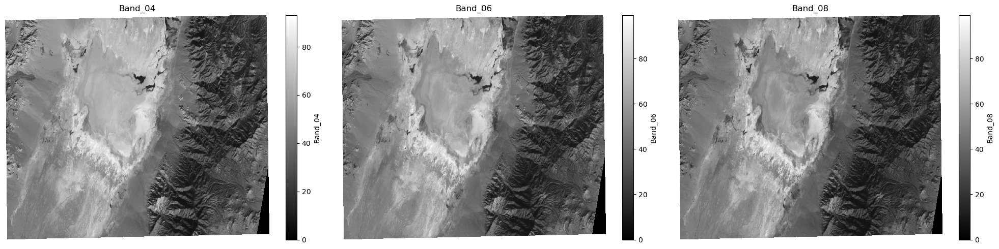

In [20]:
variables = list(aster_composite.data_vars)
n_variabales = len(variables)

ncols = 3
nrows = 1

fix, axes = plt.subplots(nrows, ncols, figsize = (20,5))
axes = axes.ravel()

for i, variable in enumerate(variables):
    ax = axes[i]
    aster_composite[variable][0].plot.imshow(ax = ax, cmap = 'grey',) 
    ax.set_title(variable)
    ax.axis('off')
plt.tight_layout()
plt.show

### 5.2 Create and Visualize Three band RGB Composite
Here we will make three band RGB composite from the aster_composite xarray dataset.

In [21]:
rgb = xr.concat([aster_composite['Band_04'], aster_composite['Band_06'], aster_composite['Band_08']],dim='band')
rgb_plot = rgb.hvplot.rgb(x='x',y='y', bands='band', aspect='equal', width=700, height=500, title='Band 04, 06, 08 Composite, Railroad Valley, Nevada')
rgb_plot

:RGB   [x,y]   (R,G,B)

Next, we can take the same plot above and plot the RGB onto a basemap.

In [22]:
rgb_plot_map = rgb.hvplot.rgb(x='x',y='y', bands ='band', xlim = (586592.68,  675603.37), ylim = (4317252.16, 4207702.37),tiles = True, crs = 'epsg = 32617', aspect ='equal', width =700, height= 500, title='Band 04, 06, 08 Composite, Railroad Valley, Nevada')
rgb_plot_map

:Overlay
   .WMTS.I :WMTS   [Longitude,Latitude]
   .RGB.I  :RGB   [x,y]   (R,G,B)

Success! You have learned how to query for and visualize AST_L1T without downloading any source data. You can now replace collection shortname, the geojson file, and temporal range in section 2 with your own and re-run the notebook.

## Contact Info  

Email: LPDAAC@usgs.gov  
Voice: +1-866-573-3222  
Organization: Land Processes Distributed Active Archive Center (LP DAAC)¹  
Website: <https://www.earthdata.nasa.gov/centers/lp-daac>  
Date last modified: 09-12-2025  

¹Work performed under USGS contract G15PD00467 for NASA contract NNG14HH33I.